In [ ]:
!gdown --id 1onaG42NZft3wCE1WH0GDEbUhu75fedP5

Downloading...
From: https://drive.google.com/uc?id=1onaG42NZft3wCE1WH0GDEbUhu75fedP5
To: /content/horse-or-human.zip
100% 150M/150M [00:01<00:00, 74.9MB/s]


In [ ]:
!gdown --id 1LYeusSEIiZQpwN-mthh5nKdA75VsKG1U


Downloading...
From: https://drive.google.com/uc?id=1LYeusSEIiZQpwN-mthh5nKdA75VsKG1U
To: /content/validation-horse-or-human.zip
100% 11.5M/11.5M [00:00<00:00, 36.9MB/s]


Unzipping both the archives

In [ ]:
import zipfile 

local_zip = "./horse-or-human.zip"
zip_ref  = zipfile.ZipFile(local_zip,"r")
zip_ref.extractall("./horse-or-human")

local_zip  = "./validation-horse-or-human.zip"
zip_ref = zipfile.ZipFile(local_zip,"r")
zip_ref.extractall("./validation-horse-or-human")

zip_ref.close()

Instead of explicitely labelling the images as horses or humans. We are going to use the ImageDataGenerator API instead -- and this is coded to automatically label images according to the directory name and structure. So, if we have a training directory containing a "horses" directory and a "humans" one. `ImageDataGenerator` will label the images appropriately for us, reducing a coding step.

In [ ]:
import os

# directory containing horses pics
train_horse_dir = os.path.join("./horse-or-human/horses")

# directory containing human pictures
train_human_dir = os.path.join("./horse-or-human/humans")

Checking names of the files

In [ ]:
train_horse_filename = os.listdir(train_horse_dir)
print(train_horse_filename[:10])
train_human_filename = os.listdir(train_human_dir)
print(train_human_filename[:10])

['horse24-7.png', 'horse28-8.png', 'horse48-5.png', 'horse25-1.png', 'horse21-7.png', 'horse37-3.png', 'horse34-0.png', 'horse49-5.png', 'horse32-0.png', 'horse03-4.png']
['human10-19.png', 'human11-18.png', 'human16-21.png', 'human07-02.png', 'human09-15.png', 'human06-14.png', 'human09-19.png', 'human04-24.png', 'human15-25.png', 'human15-18.png']


In [ ]:
print("Total training horse image: ", len(train_horse_filename))
print("Total training human images: ", len(train_human_filename))

Total training horse image:  500
Total training human images:  527


So we have about collectively 1027 images in our training dataset

Plotting some of the image and getting a closer look at them

In [ ]:
%matplotlib inline 

import matplotlib.pyplot as plt 
import matplotlib.image as mpimg

# Parameters for our graph 
nrows = 4
ncols = 4

# Index for iterating over the images
pic_index = 0

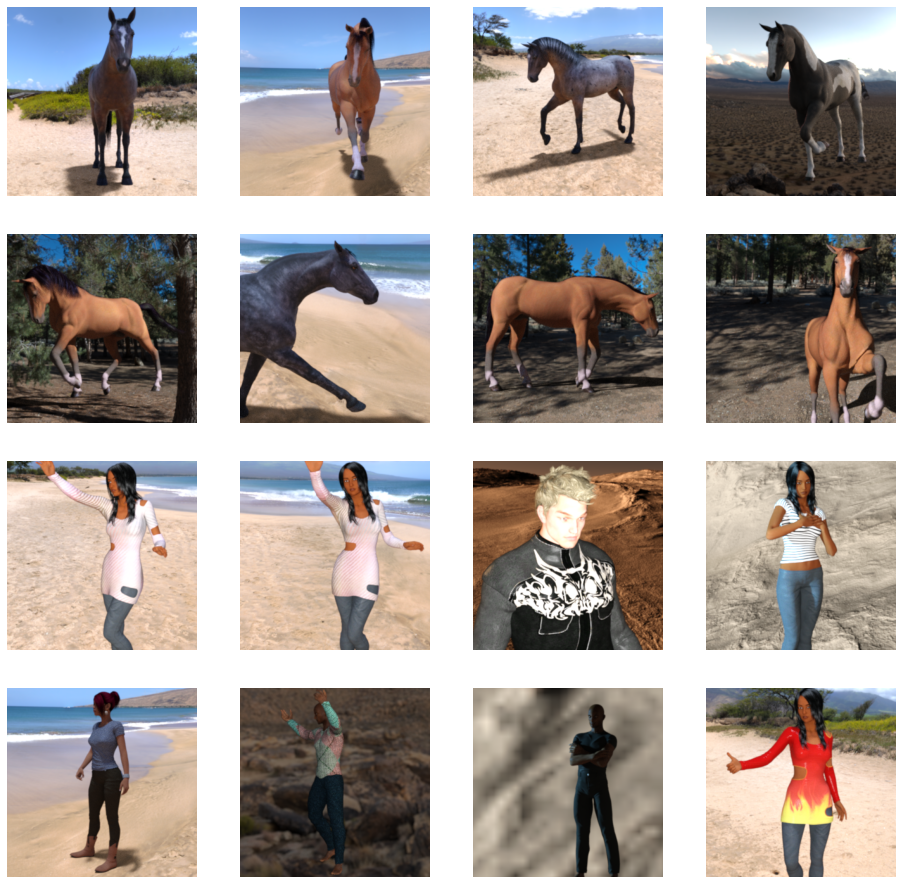

In [ ]:
fig = plt.gcf()
fig.set_size_inches(nrows*4,ncols*4)

pic_index += 8

next_horse_pix = [os.path.join(train_horse_dir,fname)
                  for fname in train_horse_filename[pic_index-8:pic_index]]
next_human_pix = [os.path.join(train_human_dir,fname)
                  for fname in (train_human_filename[pic_index-8:pic_index])]

for i, img_path in enumerate(next_horse_pix+next_human_pix):
  sp = plt.subplot(nrows,ncols,i+1)
  sp.axis("Off")
  sp.grid(False)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

## Building a small model from scratch 


In [ ]:
import tensorflow as tf

In [ ]:
# class mymodel(tf.keras.models.Model):
#   def __init__(self):
#     super(mymodel,self).__init__()
#     self.conv1 = tf.keras.layers.Conv2D(filters=16,kernel_size=(3,3),
#                                         activation=tf.keras.activations.relu,
#                                         input_shape=(300,300,3))
#     self.maxpool1 = tf.keras.layers.MaxPooling2D(pool_size=(2,2))
    
#     self.conv2 = tf.keras.layers.Conv2D(filters=32,kernel_size=(3,3),
#                                         activation=tf.keras.activations.relu)
#     self.maxpool2 = tf.keras.layers.MaxPooling2D(pool_size=(2,2))
    
#     self.conv3  = tf.keras.layers.Conv2D(filters=64,kernel_size=(3,3),
#                                          activation=tf.keras.activations.relu)
#     self.maxpool3 = tf.keras.layers.MaxPooling2D(pool_size=(2,2))

#     self.conv4 = tf.keras.layers.Conv2D(filters=64,kernel_size=(3,3),
#                                         activation=tf.keras.activations.relu)
#     self.maxpool4 = tf.keras.layers.MaxPooling2D(pool_size=(2,2))

#     self.conv5 = tf.keras.layers.Conv2D(filters=64,kernel_size=(3,3),
#                                         activation=tf.keras.activations.relu)
#     self.maxpool5 = tf.keras.layers.MaxPooling2D(pool_size=(2,2))

#     self.flatten = tf.keras.layers.Flatten()
#     self.dense1 = tf.keras.layers.Dense(units=512,activation=tf.keras.activations.relu)
#     self.dense2 = tf.keras.layers.Dense(units=1,activation=tf.keras.activations.sigmoid)

#   def call(self,inputs):
#     x = self.conv1(inputs)
#     x = self.maxpool1(x)
    
#     x = self.conv2(x)
#     x = self.maxpool2(x)

#     x = self.conv3(x)
#     x = self.maxpool3(x)

#     x = self.conv4(x)
#     x = self.maxpool4(x)

#     x = self.conv5(x)
#     x = self.maxpool5(x)

#     x = self.flatten(x)
#     x = self.dense1(x)
#     x = self.dense2(x)

#     return x

# model = mymodel()

In [ ]:
model = tf.keras.models.Sequential([
    # Note the input shape is the desired size of the image 300x300 with 3 bytes color
    # This is the first convolution
    tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(300, 300, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    # The second convolution
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The third convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The fourth convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The fifth convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # Flatten the results to feed into a DNN
    tf.keras.layers.Flatten(),
    # 512 neuron hidden layer
    tf.keras.layers.Dense(512, activation='relu'),
    # Only 1 output neuron. It will contain a value from 0-1 where 0 for 1 class ('horses') and 1 for the other ('humans')
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 298, 298, 16)      448       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 149, 149, 16)     0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 147, 147, 32)      4640      
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 73, 73, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 71, 71, 64)        18496     
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 35, 35, 64)       0

NOTE: In this case, using the RMSprop optimization algorithm is preferable to stochastic gradient descent (SGD), because RMSprop automates learning-rate tuning for us. (Other optimizers, such as Adam and Adagrad, also automatically adapt the learning rate during training, and would work equally well here.)

In [ ]:
from tensorflow.keras.optimizers import RMSprop

model.compile(loss=tf.keras.losses.BinaryCrossentropy(),
              optimizer=RMSprop(learning_rate=0.001),
              metrics=["accuracy"])
# Note: - lr is depricated using learning_rate here


## Data Preprocessing 

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Images to be rescaled by 1./255

train_datagen = ImageDataGenerator(rescale=1/255)

train_generator = train_datagen.flow_from_directory(
                  "./horse-or-human/", # the source directory of the image 
                  target_size=(300,300), # All images are resized to 300x300
                  batch_size=128, #required for faster training
                  class_mode="binary" # using binary class mode for binary labels
)

Found 1027 images belonging to 2 classes.


In [ ]:
history = model.fit(
    train_generator,
    steps_per_epoch=8,# 1024 in batches of 128 
    epochs=15,
    verbose=1
)

Epoch 1/15
8/8 [==============================] - 67s 8s/step - loss: 0.8300 - accuracy: 0.5146
Epoch 2/15
8/8 [==============================] - 54s 8s/step - loss: 0.8670 - accuracy: 0.7141
Epoch 3/15
8/8 [==============================] - 54s 7s/step - loss: 0.5211 - accuracy: 0.7553
Epoch 4/15
8/8 [==============================] - 55s 7s/step - loss: 0.2075 - accuracy: 0.9099
Epoch 5/15
8/8 [==============================] - 54s 7s/step - loss: 0.4850 - accuracy: 0.8443
Epoch 6/15
8/8 [==============================] - 54s 7s/step - loss: 0.1385 - accuracy: 0.9455
Epoch 7/15
8/8 [==============================] - 54s 7s/step - loss: 0.2282 - accuracy: 0.9155
Epoch 8/15
8/8 [==============================] - 54s 6s/step - loss: 0.2073 - accuracy: 0.9232
Epoch 9/15
8/8 [==============================] - 57s 7s/step - loss: 0.0895 - accuracy: 0.9644
Epoch 10/15
8/8 [==============================] - 61s 8s/step - loss: 0.1159 - accuracy: 0.9629
Epoch 11/15
8/8 [======================

In [ ]:
# Creating a custom image uploader in colab 

import numpy as np
from google.colab import files
from keras.preprocessing import image 

uploaded = files.upload()

for fn in uploaded.keys():

  path = "/content/" + fn
  img  = image.load_img(path,target_size=(300,300))
  x = image.img_to_array(img)
  x /= 255
  x = np.expand_dims(x,axis=0)

  images = np.vstack([x])
  classes = model.predict(images,batch_size=10)
  print(classes[0])

  if classes[0] > 0.5:
    print(fn + " is a human")
  else:
    print(fn + " is a horse")

Saving photo-1598974357801-cbca100e65d3.jfif to photo-1598974357801-cbca100e65d3.jfif
[0.43200663]
photo-1598974357801-cbca100e65d3.jfif is a horse


## Visualizing Intermediate Representations 
To get a feel for what kind of features your CNN has learned, one fun thing to do is to visualize how an input gets transformed as it goes through the model.

You can pick a random image from the training set, and then generate a figure where each row is the output of a layer, and each image in the row is a specific filter in that output feature map. Rerun this cell to generate intermediate representations for a variety of training images.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in true_divide


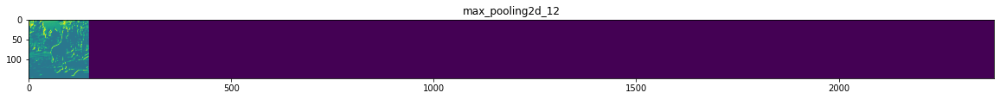

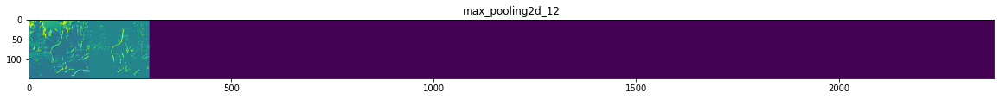

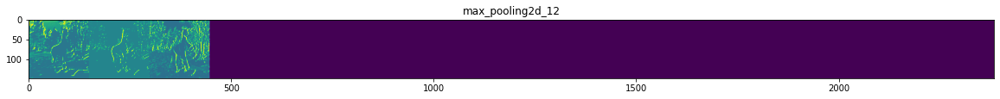

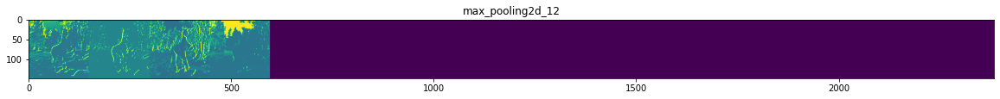

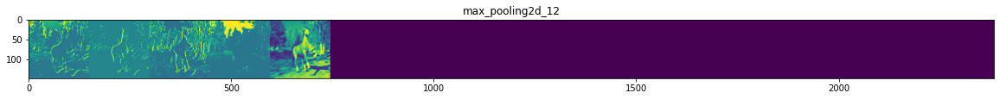

...

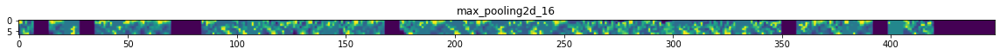

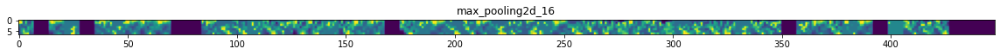

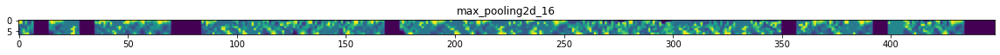

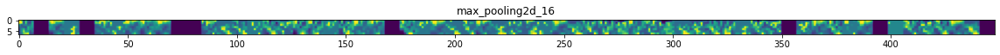

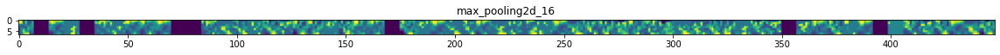

In [ ]:
import numpy as np
import random
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# Define a Model that will take an image as an input, and will output
# intermediate representations for all layers in the previous model after 
# the first
successive_outputs = [layer.output for layer in model.layers[1:]]
visualization_model = tf.keras.models.Model(inputs=model.input,outputs = successive_outputs)

# Preparing a random input image from the training set 
horse_img_file = [os.path.join(train_horse_dir,f) for f in train_horse_filename]
human_img_file = [os.path.join(train_human_dir,f) for f in train_human_filename]
img_path = random.choice(horse_img_file + human_img_file)


img = load_img(img_path,target_size=(300,300)) # this is a PIL Image
x = img_to_array(img) # Numpy array with shape (300,300,3)
x = x.reshape( (1,) + x.shape) # Numpy array with shape (1,300,300,3)

# Scaling by 255
x /= 255

# Run the image through the network, thus obtaining all
# intermediate representations for this image

successive_feature_maps = visualization_model.predict(x)

layer_names = [layer.name for layer in model.layers[1:]]

# Display the representation 

for layer_name, feature_map in zip(layer_names,successive_feature_maps):
  if len(feature_map.shape) == 4:

    # Doing this for conv/maxpool layers, not the fully connnected layers
    n_features = feature_map.shape[-1] # number of features in the feature map

    # The feature map has shape (1,shape,shape,n_features)
    size = feature_map.shape[1]
    display_grid = np.zeros((size,size * n_features))

    for i in range(n_features):
      x = feature_map[0,:,:,i]
      x -= x.mean()
      x /= x.std()
      x *= 64
      x += 128
      x = np.clip(x,0,255).astype('uint8')

      # Tile each filter into this big horizontal grid
      display_grid[:,i*size:(i+1) * size] = x

      # Display the grid 
      scale = 20./n_features
      plt.figure(figsize=(scale*n_features,scale))
      plt.title(layer_name)
      plt.grid(False)
      plt.imshow(display_grid,aspect="auto",cmap="viridis")